# Analyzing Steam Reviews and Reviewers

Using SQL and Python to create a report!

Case: An executive for a Gaming company wants to create an incentive program for Top Reviewers of games by "Most Helpful" votes. We'll analyze the data available to measure if this is the best metric for the rewards program.

In [65]:
# Run this to import the data into DataFrames
import pandas as pd

# Run this to run SQL queries with Python Pandas
from pandasql import sqldf

author_import = pd.read_csv("src/author_info.csv")
game_import = pd.read_csv("src/game_info.csv")
purchase_import = pd.read_csv("src/purchase_info.csv")
review_import = pd.read_csv("src/review_info.csv")

In [66]:
# Run klib to clean and standardize column names
import klib

klib.clean_column_names(author_import)
klib.clean_column_names(game_import)
klib.clean_column_names(purchase_import)
klib.clean_column_names(review_import)

# Review changes from one dataframe
author_import.columns

Long column names detected (>25 characters). Consider renaming the following columns ['author_playtime_last_two_weeks'].
Long column names detected (>25 characters). Consider renaming the following columns ['written_during_early_access'].


Index(['review_id', 'author_steamid', 'author_num_games_owned',
       'author_num_reviews', 'author_playtime_forever',
       'author_playtime_last_two_weeks', 'author_playtime_at_review',
       'author_last_played'],
      dtype='object')

In [67]:
import pandasql as ps

ps.sqldf("select * from game_import limit 10")

,review_id,app_id,app_name
0,68675252,489830,The Elder Scrolls V: Skyrim Special Edition
1,68675154,489830,The Elder Scrolls V: Skyrim Special Edition
2,68674806,489830,The Elder Scrolls V: Skyrim Special Edition
3,68673945,489830,The Elder Scrolls V: Skyrim Special Edition
4,68673504,489830,The Elder Scrolls V: Skyrim Special Edition
5,68673403,489830,The Elder Scrolls V: Skyrim Special Edition
6,68672722,489830,The Elder Scrolls V: Skyrim Special Edition
7,68672192,489830,The Elder Scrolls V: Skyrim Special Edition
8,68670882,489830,The Elder Scrolls V: Skyrim Special Edition
9,68669904,489830,The Elder Scrolls V: Skyrim Special Edition


Writing a(n) SQL query in single line can be tedious and confusing, especially when we want to query multiple columns.

As we are passing SQL query as a string to sqldf, we can use multi-line string.

In [68]:
query = "SELECT review_id, \
    app_id, \
    app_name \
    FROM game_import \
    LIMIT 10"

df_game = sqldf(query)
df_game

,review_id,app_id,app_name
0,68675252,489830,The Elder Scrolls V: Skyrim Special Edition
1,68675154,489830,The Elder Scrolls V: Skyrim Special Edition
2,68674806,489830,The Elder Scrolls V: Skyrim Special Edition
3,68673945,489830,The Elder Scrolls V: Skyrim Special Edition
4,68673504,489830,The Elder Scrolls V: Skyrim Special Edition
5,68673403,489830,The Elder Scrolls V: Skyrim Special Edition
6,68672722,489830,The Elder Scrolls V: Skyrim Special Edition
7,68672192,489830,The Elder Scrolls V: Skyrim Special Edition
8,68670882,489830,The Elder Scrolls V: Skyrim Special Edition
9,68669904,489830,The Elder Scrolls V: Skyrim Special Edition


In [69]:
# Let's check our data types

df_game.dtypes

review_id     int64
app_id        int64
app_name     object
dtype: object

In [70]:
# Join 2 tables without duplicating columns (use "USING" instead of "ON")

query = "SELECT * \
    FROM review_import a \
    JOIN purchase_import b \
    USING (review_id) \
    LIMIT 10"

df_merge = sqldf(query)
df_merge

,review_id,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,votes_funny,weighted_vote_score,comment_count,steam_purchase,received_for_free,written_during_early_access
0,68675252,russian,"Божечки, это же 10/10",1588772815,1588772815,1,0,0,0.00000,0,0,0,0
1,68675154,english,"What can I say, the best game ever?\nThe BEST ...",1588772690,1588772690,1,0,0,0.00000,0,1,0,0
2,68674806,english,good,1588772228,1591709306,1,1,0,0.52381,0,1,0,0
3,68673945,russian,WDPSLDFLZLD\n,1588771138,1588771138,1,0,0,0.00000,0,0,0,0
4,68673504,schinese,Pretty cool game;haven't played it much though.,1588770601,1588770601,1,0,0,0.00000,0,0,0,0
5,68673403,english,"Skyrim, for me, is one of the greatest games e...",1588770478,1588770478,1,1,0,0.52381,0,0,0,0
6,68672722,english,Hands down best game of all time. iGN 10/10,1588769597,1588769597,1,0,1,0.00000,0,0,0,0
7,68672192,schinese,游戏的自由度真的是我玩过的游戏里最高的了,1588768875,1588768875,1,0,0,0.00000,0,1,0,0
8,68670882,russian,"Спешл эдишн дали халявно, т.к. ранее покупал о...",1588767094,1588767094,1,0,0,0.00000,0,0,1,0
9,68669904,russian,"8 часов выбираешь моды, чтобы исправить кривиз...",1588765707,1588765707,1,0,0,0.00000,0,1,0,0


In [71]:
# Join all/multiple tables without duplicating columns and select all columns

query = "SELECT * \
    FROM review_import a \
    JOIN purchase_import b \
    USING (review_id) \
    JOIN game_import \
    USING (review_id) \
    JOIN author_import \
    USING (review_id)"

df = sqldf(query)
df.head()

,review_id,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,votes_funny,weighted_vote_score,comment_count,...,written_during_early_access,app_id,app_name,author_steamid,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
0,68675252,russian,"Божечки, это же 10/10",1588772815,1588772815,1,0,0,0.00000,0,...,0,489830,The Elder Scrolls V: Skyrim Special Edition,76561198199699706,56,3,5552.0,0.0,5517.0,1.588775e+09
1,68675154,english,"What can I say, the best game ever?\nThe BEST ...",1588772690,1588772690,1,0,0,0.00000,0,...,0,489830,The Elder Scrolls V: Skyrim Special Edition,76561198320854803,112,8,33707.0,0.0,27915.0,1.593310e+09
2,68674806,english,good,1588772228,1591709306,1,1,0,0.52381,0,...,0,489830,The Elder Scrolls V: Skyrim Special Edition,76561198282201987,17,9,3166.0,0.0,2633.0,1.603555e+09
3,68673945,russian,WDPSLDFLZLD\n,1588771138,1588771138,1,0,0,0.00000,0,...,0,489830,The Elder Scrolls V: Skyrim Special Edition,76561199016358734,3,2,6579.0,0.0,3569.0,1.608999e+09
4,68673504,schinese,Pretty cool game;haven't played it much though.,1588770601,1588770601,1,0,0,0.00000,0,...,0,489830,The Elder Scrolls V: Skyrim Special Edition,76561198125284145,1001,46,199.0,0.0,65.0,1.590811e+09


In [72]:
# Join all/multiple tables without duplicating columns and select only columns we want

query = "SELECT \
    review_id, \
    language, \
    review, \
    timestamp_created, \
    timestamp_updated, \
    recommended, \
    votes_helpful, \
    votes_funny, \
    weighted_vote_score, \
    comment_count, \
    steam_purchase, \
    written_during_early_access, \
    app_name, \
    author_steamid, \
    author_num_games_owned, \
    author_num_reviews, \
    author_playtime_forever, \
    author_playtime_last_two_weeks, \
    author_playtime_at_review, \
    author_last_played \
    FROM review_import a \
    JOIN purchase_import b \
    USING (review_id) \
    JOIN game_import \
    USING (review_id) \
    JOIN author_import \
    USING (review_id)"

df_1 = sqldf(query)
df_1.head()

,review_id,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,votes_funny,weighted_vote_score,comment_count,steam_purchase,written_during_early_access,app_name,author_steamid,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
0,68675252,russian,"Божечки, это же 10/10",1588772815,1588772815,1,0,0,0.00000,0,0,0,The Elder Scrolls V: Skyrim Special Edition,76561198199699706,56,3,5552.0,0.0,5517.0,1.588775e+09
1,68675154,english,"What can I say, the best game ever?\nThe BEST ...",1588772690,1588772690,1,0,0,0.00000,0,1,0,The Elder Scrolls V: Skyrim Special Edition,76561198320854803,112,8,33707.0,0.0,27915.0,1.593310e+09
2,68674806,english,good,1588772228,1591709306,1,1,0,0.52381,0,1,0,The Elder Scrolls V: Skyrim Special Edition,76561198282201987,17,9,3166.0,0.0,2633.0,1.603555e+09
3,68673945,russian,WDPSLDFLZLD\n,1588771138,1588771138,1,0,0,0.00000,0,0,0,The Elder Scrolls V: Skyrim Special Edition,76561199016358734,3,2,6579.0,0.0,3569.0,1.608999e+09
4,68673504,schinese,Pretty cool game;haven't played it much though.,1588770601,1588770601,1,0,0,0.00000,0,0,0,The Elder Scrolls V: Skyrim Special Edition,76561198125284145,1001,46,199.0,0.0,65.0,1.590811e+09


In [73]:
df_1.dtypes

review_id                           int64
language                           object
review                             object
timestamp_created                   int64
timestamp_updated                   int64
recommended                         int64
votes_helpful                       int64
votes_funny                         int64
weighted_vote_score               float64
comment_count                       int64
steam_purchase                      int64
written_during_early_access         int64
app_name                           object
author_steamid                      int64
author_num_games_owned              int64
author_num_reviews                  int64
author_playtime_forever           float64
author_playtime_last_two_weeks    float64
author_playtime_at_review         float64
author_last_played                float64
dtype: object

Note: timestamp_created and timestamp_updated are stored as int64 -- using a unix type time record; We won't be using time intelligence for this analysis

In [74]:
# Which users (steam_ids) had the most 'votes_helpful' on their reviews

top_voted_reviews = df_1.groupby("author_steamid")["votes_helpful"].sum().reset_index().sort_values("votes_helpful", ascending = False)
top_voted_reviews


,author_steamid,votes_helpful
675371,76561198301678331,26149
280175,76561198068792591,15526
396630,76561198107977827,14349
252475,76561198060932732,10610
563810,76561198193312194,10495
...,...,...
393872,76561198106854665,0
393873,76561198106856153,0
393875,76561198106856636,0
393876,76561198106856949,0


In [75]:
# Which users (author_steamid) have the most 'reviews'

most_reviews = df_1.groupby("author_steamid")["review_id"].count().reset_index().sort_values("review_id", ascending = False)
most_reviews

,author_steamid,review_id
691805,76561198315585536,22
605538,76561198239163744,20
258582,76561198062813911,19
200553,76561198045381877,17
277670,76561198068116100,17
...,...,...
319902,76561198080424312,1
319903,76561198080424324,1
319904,76561198080424388,1
319905,76561198080424757,1


In [76]:
# One Hit Wonders (ohw); Reviewers with just 1 popular review; Let's merge the last two DataFrames that we created into one so we can analyze One-Hit-Wonders
ohw = pd.merge(left=top_voted_reviews, right=most_reviews, on="author_steamid", how="inner")
ohw

,author_steamid,votes_helpful,review_id
0,76561198301678331,26149,1
1,76561198068792591,15526,1
2,76561198107977827,14349,1
3,76561198060932732,10610,2
4,76561198193312194,10495,1
...,...,...,...
912548,76561198106854665,0,2
912549,76561198106856153,0,1
912550,76561198106856636,0,1
912551,76561198106856949,0,1


In [77]:
import plotly.express as px

px.histogram(ohw, x="review_id", template="presentation", title="Histogram, Reviews per Reviewer")

In [78]:
# Let's create a DataFrame with Cumulative Percentage as a column so that we can 
# Add column to display cumulative percentage
review_count = ohw.groupby('review_id')['author_steamid'].count().reset_index()
review_count['cumperc'] = review_count['author_steamid'].cumsum()/review_count['author_steamid'].sum()*100
review_count

,review_id,author_steamid,cumperc
0,1,843838,92.470026
1,2,56007,98.607423
2,3,9085,99.602982
3,4,2340,99.859405
4,5,751,99.941702
5,6,280,99.972385
6,7,112,99.984658
7,8,53,99.990466
8,9,43,99.995178
9,10,26,99.998028


# Analysis of Top Reviewers

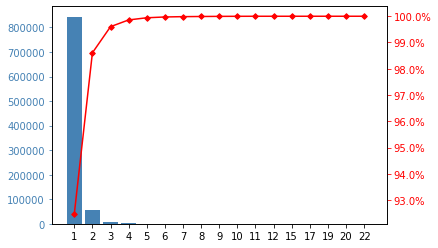

In [64]:
# https://www.statology.org/pareto-chart-python/

# Let's create a Pareto Chart using the data from the website above

import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

#define aesthetics for plot
color1 = 'steelblue'
color2 = 'red'
line_size = 4

#create basic bar plot
fig, ax = plt.subplots()
ax.bar(review_count.index,review_count['author_steamid'], color=color1)
ax.set_xticks(review_count.index, review_count['review_id'].values)

#add cumulative percentage line to plot
ax2 = ax.twinx()
ax2.plot(review_count.index,review_count['cumperc'], color=color2, marker="D", ms=line_size)
ax2.yaxis.set_major_formatter(PercentFormatter())

#specify axis colors
ax.tick_params(axis='y', colors=color1)
ax2.tick_params(axis='y', colors=color2)

#display Pareto chart
plt.show()

Over 92% of top reviewers have only reviewed a single game. Providing rewards to people who have only written one review, albeit stellar, may not be the best.